# Nelaturi_MahemaReddy_HW5

##### Name: Mahema Reddy Nelaturi
##### Github Username: mahemareddy
##### USC ID: 2814429305

## 1. Decision Trees as Interpretable Models

In [1]:
pip install xgboost


Note: you may need to restart the kernel to use updated packages.


In [2]:
import pprint
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
import xgboost as xgb

from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.tree import _tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score

### (a) Download the Accute Inflamations data from https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations


In [3]:
C_names = ['Temperature of patient', 'Occurrence of nausea', 'Lumbar pain', 'Urine pushing', 'Micturition pains', 'Burning of urethra, itch, swelling of urethra outlet', 'Inflammation of urinary bladder', 'Nephritis of renal pelvis origin']
df = pd.read_csv('../data/diagnosis.data',encoding="utf-16",sep='\t', decimal=',',header=None)
df.columns = C_names
df

,Temperature of patient,Occurrence of nausea,Lumbar pain,Urine pushing,Micturition pains,"Burning of urethra, itch, swelling of urethra outlet",Inflammation of urinary bladder,Nephritis of renal pelvis origin
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


### (b) Build a decision tree on the whole data set and plot it.

In [4]:
def get_numeric_labelled_ds(df):
    for col in C_names:
        df.loc[df[col] == 'no', col] = 0
        df.loc[df[col] == 'yes', col] = 1
    return df

In [5]:
df = get_numeric_labelled_ds(df)
df

,Temperature of patient,Occurrence of nausea,Lumbar pain,Urine pushing,Micturition pains,"Burning of urethra, itch, swelling of urethra outlet",Inflammation of urinary bladder,Nephritis of renal pelvis origin
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


In [6]:
df_X = df.iloc[:,:-2]
df_Y = df.iloc[:,-2:]
df_Y = df_Y.astype('int')
# df_Y
# df_X

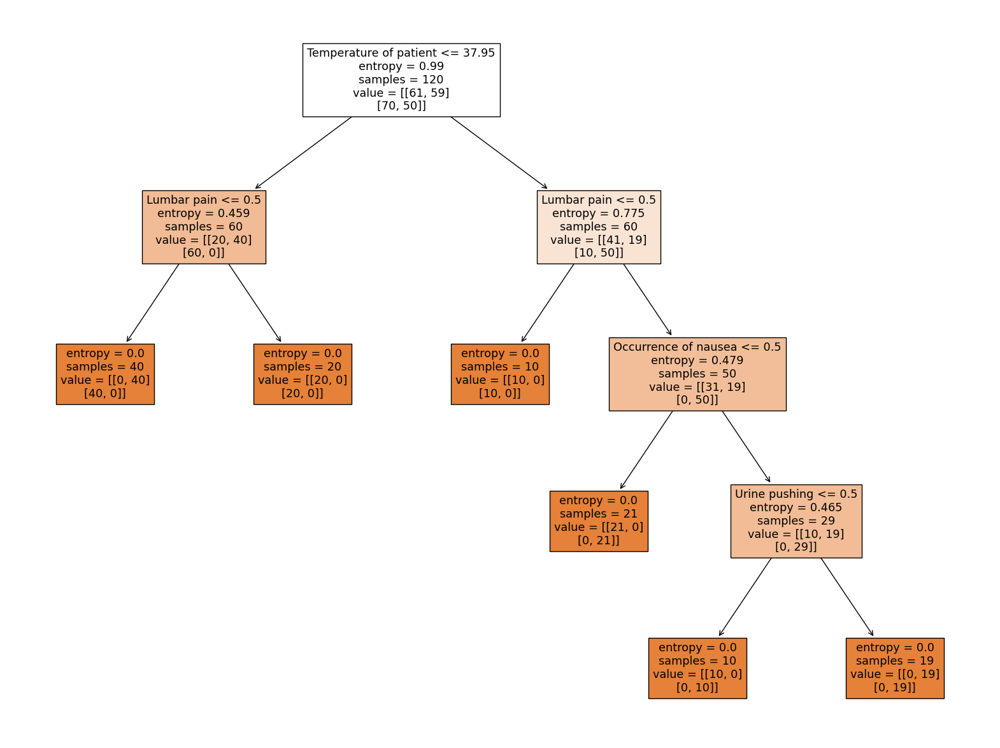

In [7]:
classifier = DecisionTreeClassifier(criterion= 'entropy')
classifier.fit(df_X, df_Y)
fig = plt.figure(figsize=(20,15))
tree.plot_tree(classifier,feature_names=['Temperature of patient','Occurrence of nausea','Lumbar pain','Urine pushing','Micturition pains','Burning of urethra, itch, swelling of urethra outlet'],filled=True)
plt.show()

### (c) Convert the decision rules into a set of IF-THEN rules.

In [8]:
def tree_to_code(tree, feature_names):
    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature
    ]
    feature_names = [f.replace(" ", "_")[:-5] for f in feature_names]
    print(feature_names)
    print("def predict({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "    " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, np.round(threshold,2)))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

In [9]:
tree_to_code(classifier, ['Temperature of patient','Occurrence of nausea','Lumbar pain','Urine pushing','Micturition pains','Burning of urethra, itch, swelling of urethra outlet'])

['Temperature_of_pa', 'Occurrence_of_n', 'Lumbar', 'Urine_pu', 'Micturition_', 'Burning_of_urethra,_itch,_swelling_of_urethra_o']
def predict(Temperature_of_pa, Occurrence_of_n, Lumbar, Urine_pu, Micturition_, Burning_of_urethra,_itch,_swelling_of_urethra_o):
    if Temperature of patient <= 37.95:
        if Lumbar pain <= 0.5:
            return [[ 0. 40.]
 [40.  0.]]
        else:  # if Lumbar pain > 0.5
            return [[20.  0.]
 [20.  0.]]
    else:  # if Temperature of patient > 37.95
        if Lumbar pain <= 0.5:
            return [[10.  0.]
 [10.  0.]]
        else:  # if Lumbar pain > 0.5
            if Occurrence of nausea <= 0.5:
                return [[21.  0.]
 [ 0. 21.]]
            else:  # if Occurrence of nausea > 0.5
                if Urine pushing <= 0.5:
                    return [[10.  0.]
 [ 0. 10.]]
                else:  # if Urine pushing > 0.5
                    return [[ 0. 19.]
 [ 0. 19.]]


### (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

In [10]:
X_train, X_test, y_train, y_test = train_test_split(df_X, df_Y, test_size=0.3, random_state=42)

In [11]:
tree1 = DecisionTreeClassifier(random_state= 42)
tree1.fit(X_train, y_train)
y_pred = tree1.predict(X_test)
print('Test accuracy of Decision Tree is:', accuracy_score(y_test, y_pred))

Test accuracy of Decision Tree is: 1.0


In [12]:
path=tree1.cost_complexity_pruning_path(X_train,y_train)
alphas=path['ccp_alphas']
alphas

array([0.        , 0.04863946, 0.08821389, 0.10569106, 0.20172997])

In [13]:
test_accuracy_list=[]
train_accuracy_list=[]

for i in alphas:
    temp_list=[]
    temp_list1=[]
    tree1=DecisionTreeClassifier(ccp_alpha=i)
    tree1.fit(X_train,y_train)
    y_pred=tree1.predict(X_test)
    y_train_pred = tree1.predict(X_train)
    temp_list.append(i)
    temp_list1.append(i)
    temp_list.append(accuracy_score(y_test,y_pred))
    test_accuracy_list.append(temp_list)
    temp_list1.append(accuracy_score(y_train,y_train_pred))
    train_accuracy_list.append(temp_list1)


b = [el[1] for el in test_accuracy_list]
c = [el[1] for el in train_accuracy_list]
train_accuracy_list

[[0.0, 1.0],
 [0.048639455782312935, 0.8452380952380952],
 [0.08821389020724565, 0.75],
 [0.10569105691056911, 0.5952380952380952],
 [0.20172997351710586, 0.25]]

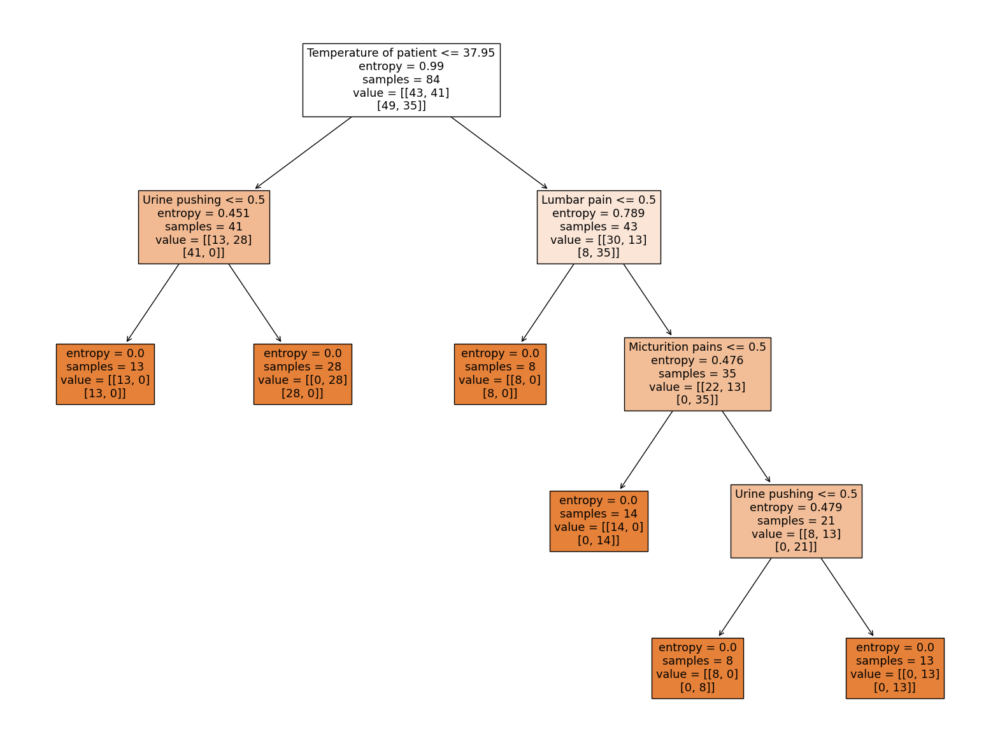

In [14]:
tree1=DecisionTreeClassifier(ccp_alpha=0,criterion='entropy')
tree1.fit(X_train,y_train)

fig = plt.figure(figsize=(20,15))
tree.plot_tree(tree1,feature_names=['Temperature of patient','Occurrence of nausea','Lumbar pain','Urine pushing','Micturition pains','Burning of urethra, itch, swelling of urethra outlet'],filled=True)
plt.show()

In [15]:
tree_to_code(tree1, ['Temperature of patient','Occurrence of nausea','Lumbar pain','Urine pushing','Micturition pains','Burning of urethra, itch, swelling of urethra outlet'])

['Temperature_of_pa', 'Occurrence_of_n', 'Lumbar', 'Urine_pu', 'Micturition_', 'Burning_of_urethra,_itch,_swelling_of_urethra_o']
def predict(Temperature_of_pa, Occurrence_of_n, Lumbar, Urine_pu, Micturition_, Burning_of_urethra,_itch,_swelling_of_urethra_o):
    if Temperature of patient <= 37.95:
        if Urine pushing <= 0.5:
            return [[13.  0.]
 [13.  0.]]
        else:  # if Urine pushing > 0.5
            return [[ 0. 28.]
 [28.  0.]]
    else:  # if Temperature of patient > 37.95
        if Lumbar pain <= 0.5:
            return [[8. 0.]
 [8. 0.]]
        else:  # if Lumbar pain > 0.5
            if Micturition pains <= 0.5:
                return [[14.  0.]
 [ 0. 14.]]
            else:  # if Micturition pains > 0.5
                if Urine pushing <= 0.5:
                    return [[8. 0.]
 [0. 8.]]
                else:  # if Urine pushing > 0.5
                    return [[ 0. 13.]
 [ 0. 13.]]


## 2. The LASSO and Boosting for Regression

### (a) Download the Communities and Crime data 3 from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime. Use the first 1495 rows of data as the training set and the rest as the test set.

In [16]:
CRIME_DATA = "../data/communities.data"
CRIME_DATA_COLS = "../data/communities.names"

In [17]:
def get_columns_crime_data(filename):
    cols = []
    if 'communities' in filename:
        file = open(filename)
        for line in file:
            if "@attribute" in line:
                line = line.split(" ")
                cols.append(line[1])
        return cols

In [18]:
cols = get_columns_crime_data(CRIME_DATA_COLS)
df = pd.read_csv(CRIME_DATA, header=None, na_values='?')
df.columns = cols
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [19]:
train_df = df.iloc[:1495, :]
test_df = df.iloc[1495:, :]
# train_df
# test_df

### (b) The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.

In [20]:
df = df.iloc[:, 5:]
train_df = train_df.iloc[:, 5:]
test_df = test_df.iloc[:, 5:]
# train_df
# test_df

In [21]:
def get_cols_to_imputate(df):
    imputated_df = df.isna().mean().round(5).mul(100).sort_values(ascending=False)
    cols_to_imputate = imputated_df[imputated_df > 0].index
    return cols_to_imputate

In [22]:
cols_to_imputate = get_cols_to_imputate(df)
cols_to_imputate

Index(['PolicReqPerOffic', 'PctPolicMinor', 'LemasSwornFT', 'LemasSwFTPerPop',
       'LemasSwFTFieldOps', 'LemasSwFTFieldPerPop', 'LemasTotalReq',
       'LemasTotReqPerPop', 'PolicPerPop', 'RacialMatchCommPol',
       'PctPolicWhite', 'PctPolicBlack', 'PctPolicAsian', 'PctPolicHisp',
       'OfficAssgnDrugUnits', 'PolicCars', 'PolicBudgPerPop',
       'LemasGangUnitDeploy', 'LemasPctPolicOnPatr', 'NumKindsDrugsSeiz',
       'PolicOperBudg', 'PolicAveOTWorked', 'OtherPerCap'],
      dtype='object')

In [23]:
def impute(df):
    imputer = SimpleImputer(strategy='mean', missing_values=np.nan)
    for col in cols_to_imputate:
        imputer = imputer.fit(train_df[[col]])
        train_df[[col]] = imputer.transform(train_df[[col]])
        test_df[[col]] = imputer.transform(test_df[[col]])
    df_imputed=pd.concat([train_df,test_df])
    return df_imputed

In [24]:
df_imputed = impute(df)
df_imputed

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


### (c) Plot a correlation matrix for the features in the data set.

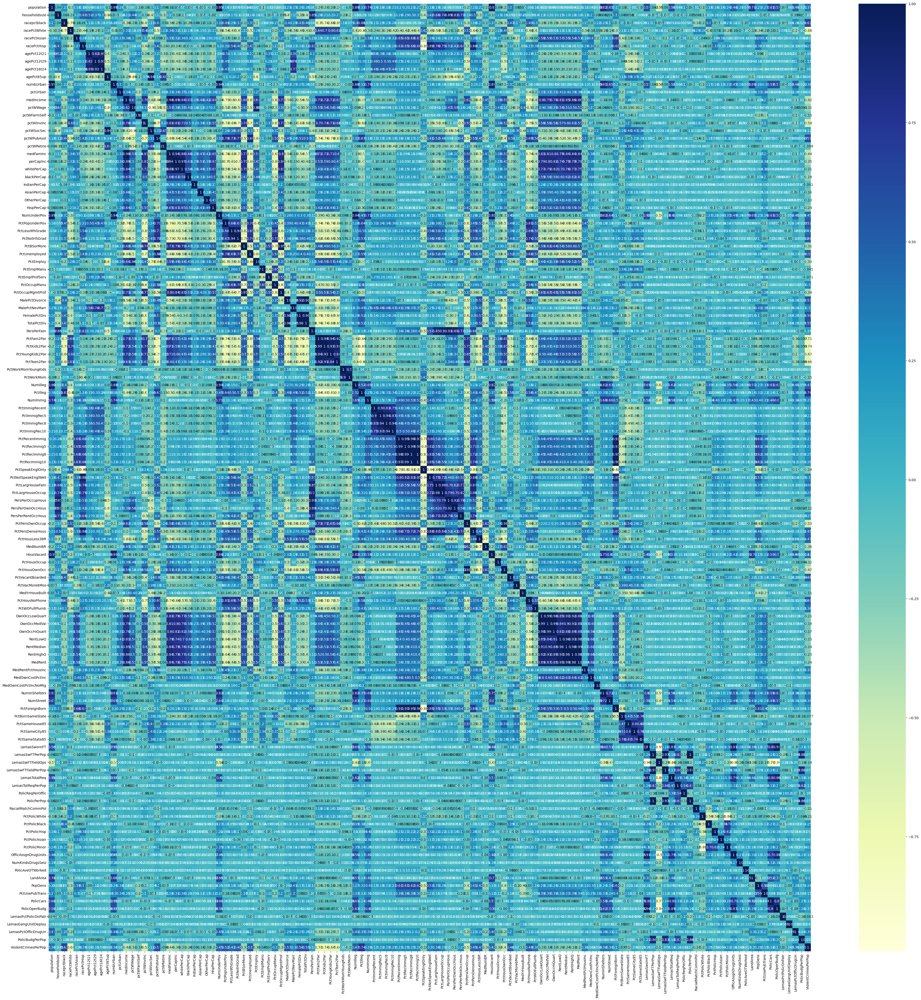

In [25]:
plt.figure(figsize=(50, 50))
corr = df_imputed.corr()
sns.heatmap(corr, cmap="YlGnBu", annot=True)
plt.show()

### (d) Calculate the Coefficient of Variation CV for each feature, whereCV =s/m, inwhichsis sample standard deviation and m is sample mean.

In [26]:
describe = df_imputed.describe(include='all')
std = describe.loc['std']
mean = describe.loc['mean']
describe.loc['CV'] = std / mean
cv_features = describe.loc[['std','mean','CV']]
cv_features

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
std,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,...,0.109459,0.203092,0.229055,0.085793,0.056023,0.085624,0.162153,0.240328,0.065815,0.232985
mean,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,...,0.065231,0.232854,0.161685,0.163835,0.079895,0.710740,0.450052,0.094052,0.191445,0.237979
CV,2.203503,0.353298,1.410920,0.323782,1.359162,1.614278,0.365840,0.290693,0.495161,0.423442,...,1.678031,0.872187,1.416673,0.523655,0.701202,0.120471,0.360299,2.555266,0.343782,0.979015


### (e) Pick [ √128] features with highest CV, and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [27]:
print("Top Features with Highest CV:")
end = int(np.sqrt(128))
top_cv_features = cv_features.loc['CV'].sort_values(ascending=False)
top_cv_features = top_cv_features[:end]
top_cv_features

Top Features with Highest CV:


NumStreet              4.407702
NumInShelters          3.485481
NumIlleg               2.994196
NumImmig               2.900497
LemasPctOfficDrugUn    2.555266
NumUnderPov            2.304970
population             2.203503
numbUrban              2.001744
HousVacant             1.958780
LandArea               1.678031
racePctHisp            1.614278
Name: CV, dtype: float64

/Users/mahemareddy/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


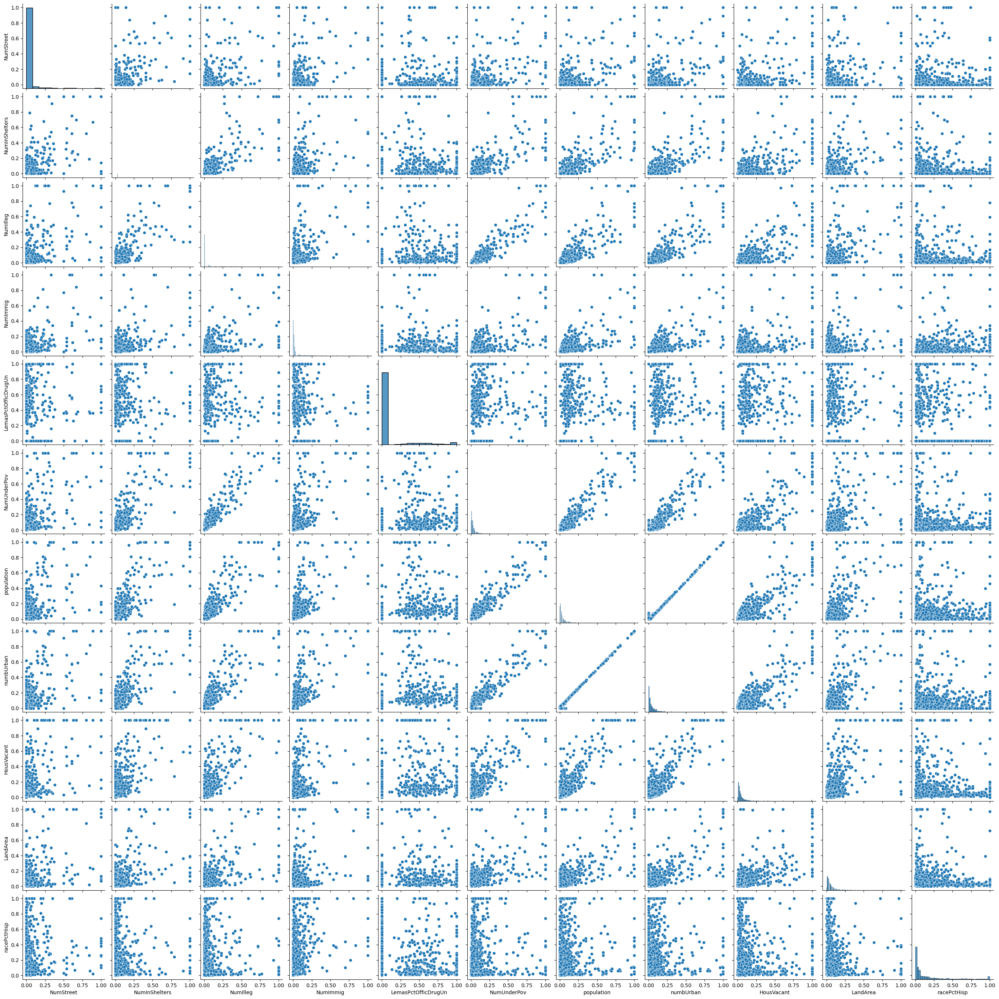

In [28]:
sns.pairplot(df_imputed[top_cv_features.index])
plt.show()

<Axes: >

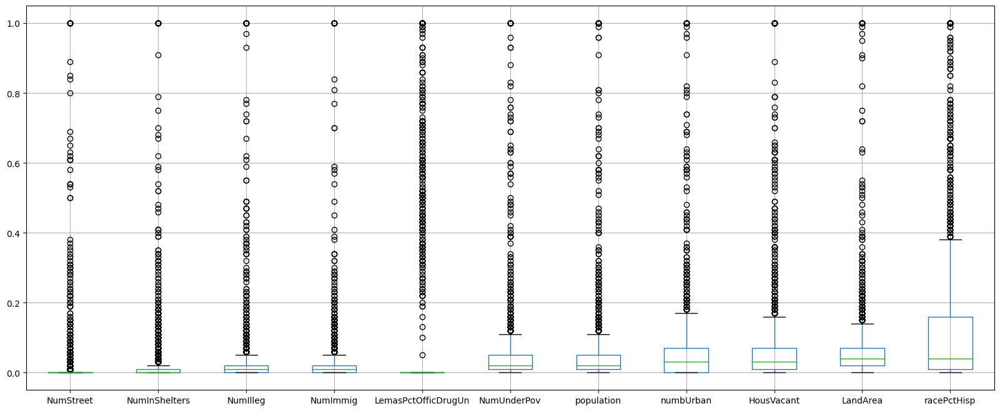

In [29]:
df_imputed[top_cv_features.index].boxplot(figsize=(20,8))

Observations:
- The scatteplots are truely scattered and it seems that no conclusion can be drawn solely from the scatterplot alone.
- However, combining a scatterplot with a boxplot seems to provide some insight especially when the datapoints increase.

### (f) Fit a linear model using least squares to the training set and report the test error.

In [30]:
def get_X_Y_split(df):
    x_data = df.iloc[:, :-1]
    y_data = df.iloc[:, -1:]
    return x_data, y_data

In [31]:
train_X, train_Y = get_X_Y_split(train_df)
test_X, test_Y = get_X_Y_split(test_df)

In [32]:
train_sm = sm.add_constant(train_X)
model = sm.OLS(train_Y, train_sm).fit()
predicted_dataY = model.predict(train_sm)
display(model.summary())
mse_train = mean_squared_error(train_Y, predicted_dataY)

test_sm = sm.add_constant(test_X)
predicted_dataY_test = model.predict(test_sm)
mse_test = mean_squared_error(test_Y, predicted_dataY_test)
train_mse = round(mse_train, 4)
test_mse = round(mse_test, 4)

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.711
Model:                             OLS   Adj. R-squared:                  0.686
Method:                  Least Squares   F-statistic:                     27.94
Date:                 Fri, 22 Mar 2024   Prob (F-statistic):          6.56e-291
Time:                         15:41:47   Log-Likelihood:                 955.40
No. Observations:                 1495   AIC:                            -1667.
Df Residuals:                     1373   BIC:                            -1019.
Df Model:                          121                                         
Covariance Type:             nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.4544      0.904      0.503      0.615      -1.319       2.228
population               -0.0199      0.477     -0.042      0.967      -0.955       0.916
householdsize            -0.0157      0.098     -0.161      0.872      -0.207       0.176
racepctblack              0.2848      0.060      4.754      0.000       0.167       0.402
racePctWhite              0.0106      0.067      0.159      0.874      -0.120       0.141
racePctAsian             -0.0278      0.041     -0.670      0.503      -0.109       0.054
racePctHisp               0.0180      0.065      0.275      0.784      -0.110       0.146
agePct12t21               0.1792      0.129      1.387      0.166      -0.074       0.433
agePct12t29              -0.3451      0.186     -1.858      0.063      -0.709       0.019
agePct16t24              -0.1237      0.198     -0.626      0.531      -0.511       0.264
agePct65up                0.0597      0.124      0.481      0.630      -0.184       0.303
numbUrban                -0.1260      0.465     -0.271      0.786      -1.038       0.786
pctUrban                  0.0484      0.019      2.581      0.010       0.012       0.085
medIncome                -0.1784      0.202     -0.881      0.378      -0.575       0.219
pctWWage                 -0.1399      0.107     -1.309      0.191      -0.350       0.070
pctWFarmSelf              0.0460      0.023      1.960      0.050   -3.35e-05       0.092
pctWInvInc               -0.2031      0.081     -2.505      0.012      -0.362      -0.044
pctWSocSec                0.1368      0.125      1.092      0.275      -0.109       0.383
pctWPubAsst               0.0601      0.054      1.109      0.268      -0.046       0.166
pctWRetire               -0.1249      0.045     -2.802      0.005      -0.212      -0.037
medFamInc                 0.3049      0.189      1.617      0.106      -0.065       0.675
perCapInc                -0.0485      0.222     -0.219      0.827      -0.484       0.387
whitePerCap              -0.1923      0.179     -1.072      0.284      -0.544       0.160
blackPerCap              -0.0401      0.030     -1.358      0.175      -0.098       0.018
indianPerCap             -0.0436      0.023     -1.911      0.056      -0.088       0.001
AsianPerCap               0.0301      0.022      1.381      0.168      -0.013       0.073
OtherPerCap               0.0304      0.022      1.364      0.173      -0.013       0.074
HispPerCap                0.0330      0.029      1.150      0.250      -0.023       0.089
NumUnderPov               0.0737      0.192      0.383      0.702      -0.303       0.451
PctPopUnderPov           -0.2035      0.074     -2.736      0.006      -0.349      -0.058
PctLess9thGrade          -0.0584      0.079     -0.743      0.457      -0.213       0.096
PctNotHSGrad

In [33]:
print("Train MSE: ", train_mse)
print("Test MSE: ", test_mse)

Train MSE:  0.0163
Test MSE:  0.0181


The linear regression model trained using least squares achieved an R-squared value of approximately 0.711 on the training set, indicating that approximately 71.1% of the variance in the target variable is explained by the independent variables included in the model.


### (g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.

In [34]:
alphas = []
def get_alphas():
    for i in range(-10, 11, 1):
        alphas.append(10**i)
    return alphas

In [35]:
rr = RidgeCV(alphas=get_alphas(),
             cv=KFold(n_splits=5, random_state=1, shuffle=True),
             scoring='neg_mean_squared_error')
rr.fit(train_X, train_Y)
print("Model info:", rr)

predicted_Y = rr.predict(test_X)
chosen_alpha = rr.alpha_
test_mse = mean_squared_error(test_Y,predicted_Y)
test_r2 = r2_score(test_Y,predicted_Y)

print("Chosen Alpha: ", chosen_alpha)
print("Test MSE: ", test_mse)
print("Test R2: ", test_r2)

Model info: RidgeCV(alphas=[1e-10, 1e-09, 1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001, 0.01,
                0.1, 1, 10, 100, 1000, 10000, 100000, 1000000, 10000000,
                100000000, 1000000000, 10000000000],
        cv=KFold(n_splits=5, random_state=1, shuffle=True),
        scoring='neg_mean_squared_error')
Chosen Alpha:  1.0
Test MSE:  0.017732474992896645
Test R2:  0.6271188537091104


- The ridge regression model achieved a test MSE of approximately 0.0177. This metric represents the average squared difference between the actual and predicted values, indicating the model's predictive accuracy on the test set.
- The chosen alpha value for regularization, which is 1.0 in this case, was selected through cross-validation.
- The R-squared value of approximately 0.627 suggests that the model explains about 62.7% of the variance in the target variable. While this indicates a moderate level of predictive power, there might still be room for improvement.

### (h) Fit a LASSO model on the training set, with λ chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized 4 features. Report the test error for both cases and compare them.

In [36]:
def get_stats(train_x, train_y, test_x, test_y, is_standardized=False):
    scaler = StandardScaler()
    lr = LassoCV(alphas = get_alphas(),
                 cv = KFold(n_splits=5, random_state=50, shuffle=True),
                 max_iter = 10000)
    
    if is_standardized:
        train_x = scaler.fit_transform(train_x)
        test_x = scaler.fit_transform(test_x)
        
    lr.fit(train_x, train_y)
    predicted_y = lr.predict(test_x)

    chosen_alpha = lr.alpha_
    test_mse = mean_squared_error(test_y, predicted_y)
    test_r2 = r2_score(test_y,predicted_y)

    print("Chosen Alpha: ", chosen_alpha)
    print("Test MSE: ", test_mse)
    print("Test R2: ", test_r2)
    return lr

In [37]:
lr = get_stats(train_X, train_Y, test_X, test_Y)

/Users/mahemareddy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Chosen Alpha:  0.0001
Test MSE:  0.01778608951910212
Test R2:  0.6259914394030223


In [38]:
def get_selected_variable_list():    
    lasso_dict_coef = {}
    count_cols = len(train_X.columns)
    for i in range(count_cols):    
        if lr.coef_[i] != 0:
            lasso_dict_coef[train_X.columns[i]] = [round(lr.coef_[i], 4)]

    print('Number of features: ', len(lasso_dict_coef))
    pprint.pprint(lasso_dict_coef)

In [39]:
get_selected_variable_list()

Number of features:  78
{'AsianPerCap': [0.0292],
 'FemalePctDiv': [-0.0956],
 'HispPerCap': [0.0257],
 'HousVacant': [0.1303],
 'LandArea': [0.0411],
 'LemasGangUnitDeploy': [0.0407],
 'LemasPctOfficDrugUn': [0.0006],
 'LemasPctPolicOnPatr': [0.0217],
 'LemasSwFTFieldPerPop': [0.0836],
 'LemasTotalReq': [-0.0395],
 'MalePctDivorce': [0.1326],
 'MalePctNevMarr': [0.1507],
 'MedNumBR': [0.006],
 'MedOwnCostPctInc': [-0.018],
 'MedOwnCostPctIncNoMtg': [-0.0796],
 'MedRent': [0.1734],
 'MedRentPctHousInc': [0.0906],
 'MedYrHousBuilt': [-0.0162],
 'NumIlleg': [-0.0623],
 'NumImmig': [-0.0812],
 'NumInShelters': [0.0633],
 'NumKindsDrugsSeiz': [-0.0324],
 'NumStreet': [0.1696],
 'OfficAssgnDrugUnits': [-0.0075],
 'OtherPerCap': [0.0236],
 'OwnOccLowQuart': [-0.0189],
 'PctBSorMore': [0.0173],
 'PctEmplManu': [-0.0192],
 'PctEmploy': [0.155],
 'PctForeignBorn': [0.054],
 'PctHousLess3BR': [0.0649],
 'PctHousNoPhone': [0.0268],
 'PctHousOccup': [-0.0595],
 'PctIlleg': [0.0956],
 'PctImmigRec1

In [40]:
lr = get_stats(train_X, train_Y, test_X, test_Y, is_standardized=True)

/Users/mahemareddy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Chosen Alpha:  0.001
Test MSE:  0.01794917054660061
Test R2:  0.6225621470737623


In [41]:
get_selected_variable_list()

Number of features:  68
{'AsianPerCap': [0.0049],
 'FemalePctDiv': [-0.0024],
 'HispPerCap': [0.0031],
 'HousVacant': [0.016],
 'LandArea': [0.0041],
 'LemasGangUnitDeploy': [0.0062],
 'LemasPctPolicOnPatr': [0.0021],
 'LemasSwFTFieldPerPop': [0.0075],
 'LemasTotalReq': [-0.006],
 'MalePctDivorce': [0.0151],
 'MalePctNevMarr': [0.0151],
 'MedOwnCostPctInc': [-0.0003],
 'MedOwnCostPctIncNoMtg': [-0.0135],
 'MedRent': [0.0191],
 'MedRentPctHousInc': [0.0147],
 'MedYrHousBuilt': [-0.0021],
 'NumIlleg': [-0.0016],
 'NumImmig': [-0.0064],
 'NumInShelters': [0.0057],
 'NumKindsDrugsSeiz': [-0.0026],
 'NumStreet': [0.0179],
 'OfficAssgnDrugUnits': [-0.0033],
 'OtherPerCap': [0.0034],
 'PctEmplManu': [-0.0002],
 'PctEmploy': [0.0143],
 'PctForeignBorn': [0.0042],
 'PctHousLess3BR': [0.0087],
 'PctHousOccup': [-0.0117],
 'PctIlleg': [0.0255],
 'PctImmigRec5': [-0.0006],
 'PctKids2Par': [-0.0396],
 'PctLargHouseOccup': [-0.0],
 'PctLess9thGrade': [-0.0002],
 'PctNotSpeakEnglWell': [-0.0032],
 'P

- For the non-standardized features, the LASSO model achieved a test MSE of approximately 0.0178 and an R-squared value of around 0.626
- When using standardized features, the test MSE slightly increased to approximately 0.0179, with a similar R-squared value of about 0.623
- This reduction in the number of features suggests that LASSO effectively performed feature selection by shrinking coefficients of irrelevant features to zero.


### (i) Fit a PCR model on the training set, with M (the number of principal compo- nents) chosen by cross-validation. Report the test error obtained.

In [42]:
def pcr_model(train_x, train_y, dimension):
    scores=[]
    CV = 5
    job_count = -1
    pca = PCA(n_components = dimension)
    LR = LinearRegression(fit_intercept=True)    
    pipeline = make_pipeline(pca, LR)
    scores=cross_val_score(pipeline,
                           train_x,
                           train_y,
                           cv=CV,
                           n_jobs=job_count,
                           scoring="neg_mean_squared_error")
    
    return sum(abs(scores))/len(scores)

In [43]:
pcr_dict = {}
count_cols = len(train_X.columns)
for i in range(1, count_cols + 1):
    pcr_dict[i] = pcr_model(train_X, train_Y, i)

pprint.pprint(pcr_dict)
minval = float('inf')
for key,value in pcr_dict.items():
    if value < minval:
        min_key = key
    minval = min(minval, value)

print("Selected M: ", min_key)
print("Minimum Validation Error: ", minval)

{1: 0.03790095364846822,
 2: 0.03062925126911049,
 3: 0.027566685581129485,
 4: 0.024294378779599723,
 5: 0.02309291079243938,
 6: 0.02264848549549328,
 7: 0.020143623664009135,
 8: 0.020116090723685448,
 9: 0.020036681639075023,
 10: 0.019972296614364084,
 11: 0.02001047623665474,
 12: 0.02005205540739683,
 13: 0.019931760358505152,
 14: 0.019970080727770435,
 15: 0.02000320179610737,
 16: 0.02000962710460744,
 17: 0.020034523495645874,
 18: 0.020126398386947447,
 19: 0.020159629023312555,
 20: 0.020253561522496584,
 21: 0.020274237119425442,
 22: 0.02023500653514675,
 23: 0.02006190005301023,
 24: 0.02001340269595675,
 25: 0.020022462267240294,
 26: 0.020064842252475533,
 27: 0.020053056838428552,
 28: 0.02004264555909477,
 29: 0.019929571583082405,
 30: 0.019897315215231796,
 31: 0.019918351311633744,
 32: 0.019934867835208724,
 33: 0.019954992971305253,
 34: 0.019926457231449993,
 35: 0.019974557843192853,
 36: 0.019996156774035344,
 37: 0.019946700851769732,
 38: 0.019904879721372

In [44]:
count_components = min_key
pca = PCA(n_components = count_components).fit(train_X)
pca_train = pca.transform(train_X)
pca_test = pca.transform(test_X)
LR = LinearRegression().fit(pca_train, train_Y)
predicted_Y_test = LR.predict(pca_test)
pca_test_mse = mean_squared_error(test_Y, predicted_Y_test)
print("PCA Test MSE: ", round(pca_test_mse, 4))

PCA Test MSE:  0.0185


- The PCR model achieved a test MSE of approximately 0.0185, indicating the average squared difference between the predicted values and the actual values on the test dataset.
- Through cross-validation, the optimal number of principal components was determined to be 96, where the model demonstrated the minimum validation error of approximately 0.0194

### (j) In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L 1 -penalized regression at each node. Such a tree is called L 1 penalized gradient boosting tree. You can use XGBoost 5 to fit the model tree. Determine α (the regularization term) using cross-validation.

In [45]:
stats_xgb = {}
for alpha in get_alphas():
    model = xgb.XGBRegressor(objective='reg:squarederror',
                             reg_alpha = alpha, 
                             random_state = 50)
    score=cross_val_score(model,
                          train_X,
                          train_Y,
                          cv=KFold(5, shuffle=True,random_state=50),
                          n_jobs=-1,
                          scoring="neg_mean_squared_error")
    val = sum(abs(score)) / len(score)
    stats_xgb[alpha]= f'{round(val, 4)}'
    
pprint.pprint(stats_xgb)

minval=float('inf')
for key, value in stats_xgb.items():
    if float(value) < minval:
        minval = float(value)
        min_key = key

print("Selected Alpha: ", min_key)
print("Minimum Validation Error MSE: ", minval)

{1e-10: '0.0234',
 1e-09: '0.0234',
 1e-08: '0.0234',
 1e-07: '0.0234',
 1e-06: '0.0233',
 1e-05: '0.0234',
 0.0001: '0.0236',
 0.001: '0.0227',
 0.01: '0.022',
 0.1: '0.0219',
 1: '0.021',
 10: '0.0225',
 100: '0.0565',
 1000: '0.0565',
 10000: '0.0565',
 100000: '0.0565',
 1000000: '0.0565',
 10000000: '0.0565',
 100000000: '0.0565',
 1000000000: '0.0565',
 10000000000: '0.0565'}
Selected Alpha:  1
Minimum Validation Error MSE:  0.021


In [46]:
model = xgb.XGBRegressor(objective='reg:squarederror',
                             reg_alpha = min_key, 
                             random_state = 50)
model.fit(train_X,train_Y)
test_predicted_xgb = model.predict(test_X)
test_mse = mean_squared_error(test_Y,test_predicted_xgb)
print("XGBoost Test MSE: ", test_mse)

XGBoost Test MSE:  0.017747461401957192


- The L1 penalized gradient boosting tree model achieved a test MSE of approximately 0.0177, indicating the average squared difference between the predicted values and the actual values on the test dataset.
- Through cross-validation, the optimal regularization term (alpha) for the L1 penalized gradient boosting tree model was determined to be 1